# Advanced Lane Finding


The goals / steps of this project are the following:  

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply the distortion correction to the raw image.  
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view"). 
* Detect lane pixels and fit to find lane boundary.
* Determine curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

Examples are give throughout.

## Camera Calibration Matrix and Distortion Coefficients

In [1]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import pickle
import glob
import os
%matplotlib inline

#%matplotlib qt

def calibrate_lens(cal_imgs, nx, ny):
    #3 of the 20 images in the test image file where not being read in with 9 by 6
    #so the maximum posible dimensions where used.
    nx=[5,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6,6]
    ny=[9,9,9,5,7,9,9,9,9,9,9,9,9,9,9,9,9,9,9,9]

    #Arrays to store object points and image points from all the images
    objpoints = [] #3D points in real world space, all same 8by6by1 board
    imgpoints = [] #2D points in image plane

    # Make a list of calibration images
    images = glob.glob(cal_imgs)
    
    #images = sorted(images)
    #print(images)

    count = 0
    # Step through the list and search for chessboard corners
    for idx, fname in enumerate(images):
        
        #Prepare object points, like (0,0,0),(1,0,0),(2,0,0)...,(7,5,0)
        #objp = np.zeros((6*8,3), np.float32)
        objp = np.zeros((ny[idx]*nx[idx],3), np.float32) 
        #objp[:,:2] = np.mgrid[0:8,0:6].T.reshape(-1,2) #x,y coordinates
        objp[:,:2] = np.mgrid[0:nx[idx],0:ny[idx]].T.reshape(-1,2) #x,y coordinates        
        #print(idx)
        img = cv2.imread(fname)
        #Grayscale
        gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

        #Find Chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (nx[idx], ny[idx]), None)
        #print( ret, corners)
        #If found, draw corners
        if ret== True:
            count +=1
            imgpoints.append(corners)
            objpoints.append(objp)
            #Draw and display corners
            #img = cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            #cv2.drawChessboardCorners(img, (nx, ny), corners, ret)
            #plt.imshow(img)
            #cv2.waitKey(500)
    #cv2.destroyAllWindows()
    #print(count, "C")
    #print(count, len(objpoints), len(imgpoints))
    
    #return (cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None,None), count )    
    return cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None,None) 


ret, mtx, dist, rvecs, tvecs =    calibrate_lens('camera_cal/calibration*.jpg', nx =9, ny =6) 

## Distortion Correction

In [2]:
#Read and display the original images one at a time

#image = mpimg.imread('test_images/solidWhiteRight.jpg')
#image = mpimg.imread('test_images/solidYellowLeft.jpg')
#image = mpimg.imread('test_images/test1.jpg')
#image = mpimg.imread('test_images/test2.jpg')
#image = mpimg.imread('test_images/test3.jpg')
#image = mpimg.imread('test_images/test4.jpg')
image = mpimg.imread('test_images/test5.jpg')
#image = mpimg.imread('test_images/test6.jpg')
#print(image.shape)

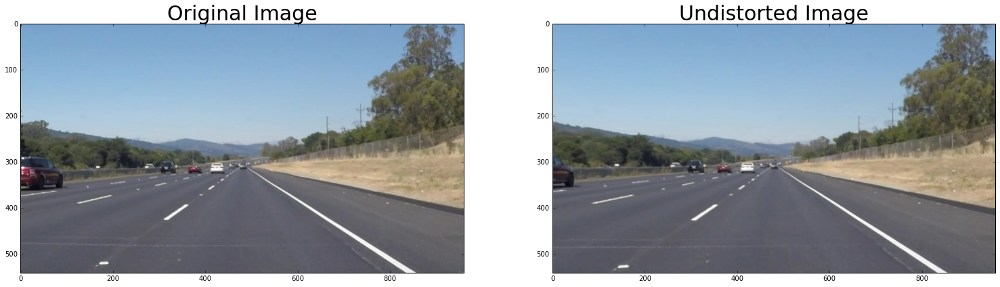

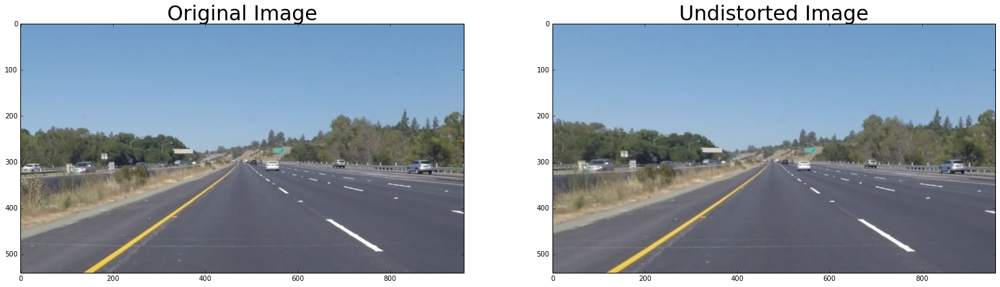

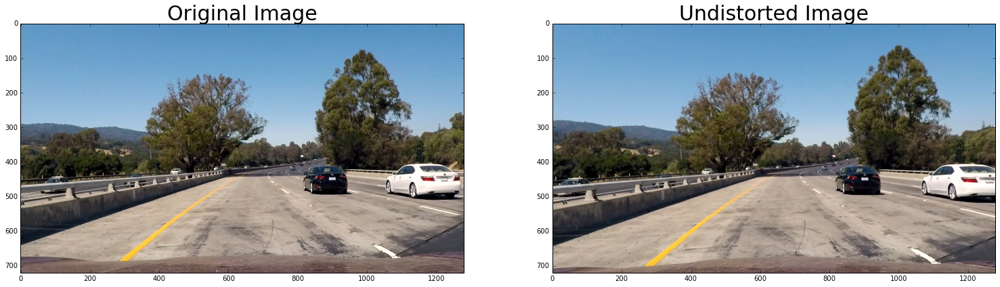

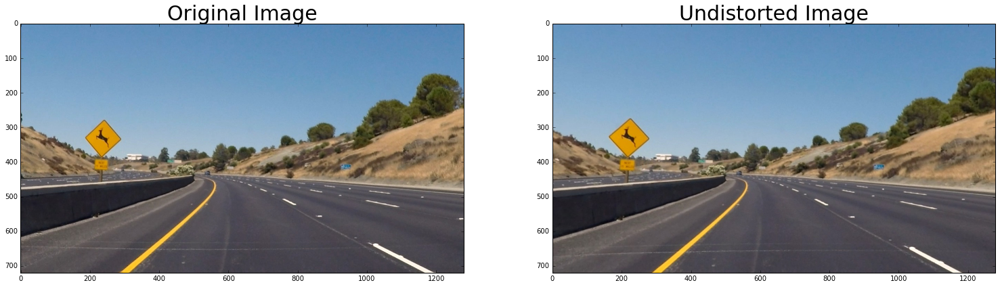

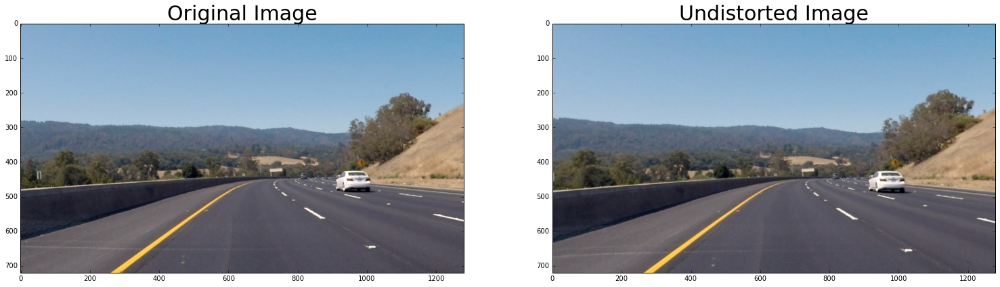

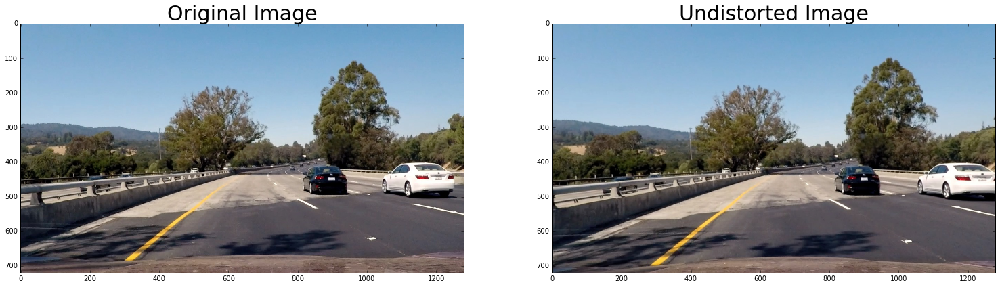

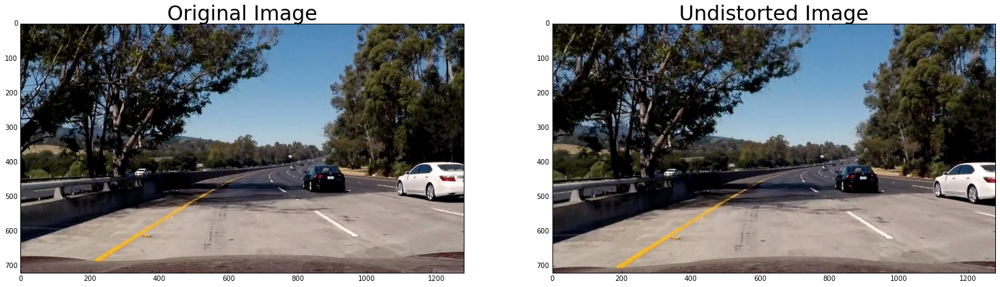

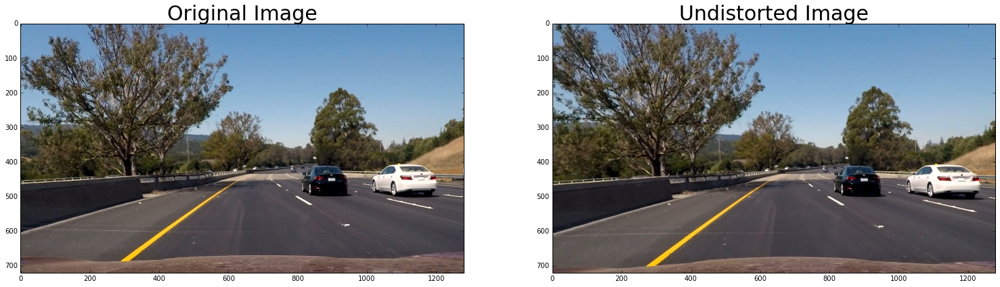

In [3]:
images = glob.glob('test_images/*')

count = 0
# Step through the list and search for chessboard corners
for idx, fname in enumerate(images):                 
    img = mpimg.imread(fname)
    img_size = (img.shape[1], img.shape[0])                 
    dst = cv2.undistort(img, mtx, dist, None, mtx)             
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(dst)
    ax2.set_title('Undistorted Image', fontsize=30)  
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)    
    

## Create Thresholded Binary Image
Functions were written to get the high, med and low thresholds of RBG, HLS , Magnitude and Direction Gradients and create a binary images. An example of the visualization demonstrates that the high threshold for the S channel of HLS was one of the best for visualizing the lane lines in shadowy areas. 

In [4]:
#Gradient Threshold
#Applying Sobel

#Define a function that takes an image, gradient orientation,
# and threshold min/ max values.
#Scale the result to an 8-bit range (0-255)

def abs_sobel_thresh(img, sobel_kernel = 3, orient = 'x', thresh = (0,255)):
    #Grayscale
    gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Apply x or y gradient with the OpenCV Sobel() function
    #and take the absolute value
    if orient == 'x':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize= sobel_kernel))
    if orient == 'y':
        abs_sobel = np.absolute(cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize= sobel_kernel))
    # Rescale back to 8 bit integer
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    #Create a copy and apply the threshold
    binary_output = np.zeros_like(scaled_sobel)
    # Here I'm using inclusive (>=, <=) thresholds, but exclusive is ok too
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1
    #Return the binary image
    return binary_output  

In [5]:
#Magnitude of the Gradient

#Define a function to return  the magnitude of the gradient
#for a given sobel kernel size  and  threshold values
#Test that your function returns output similar to the example below for sobel_kernel=9, mag_thresh=(30, 100).
#image lesson 20 
def mag_thresh(img, sobel_kernel = 3,x_or_y_or_xy= 'xy', mag_thresh = (0,255)):
    #Grayscale
    gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize= sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize= sobel_kernel)
    #Calculate the gradient magnitude
    if (x_or_y_or_xy == 'xy'):
        gradmag = np.sqrt(sobelx**2 + sobely**2)
    elif(x_or_y_or_xy == 'x'):
        gradmag = np.sqrt(sobelx**2 )
    else:
        gradmag = np.sqrt( sobely**2)
    #Rescale to 8 bit
    scale_factor = np.max(gradmag)/255
    gradmag = (gradmag/scale_factor).astype(np.uint8)
    #Create a binary image of ones where threshold is met, zeros otherwise
    binary_output = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & (gradmag <= mag_thresh[1])] = 1
    #Return the binary image
    return binary_output    

In [6]:
#Direction of the Gradient

#The direction of the gradient is simply the arctangent of the 
#y-gradient divided by the x-gradient. tan^−1 (sobel y /sobel x ).
#Each pixel of the resulting image contains a value for the angle of the 
#gradient away from horizontal in units of radians, 
#covering a range of −π/2 to π/2. An orientation of 0 implies 
#a horizontal line and orientations of +/−π/2 imply vertical lines.

#Define a function to threshold an image for a given range and Sobel kernal
def dir_threshold(img, sobel_kernel = 9, thresh=(0, np.pi/2)):
    #Grayscale
    gray= cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    #Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize= sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize= sobel_kernel)
    #Take the absolute value of the gradient direction,
    #apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output = np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1
    #Return the binary image
    return binary_output

In [7]:
#Define a function that thresholds the S-channel of HLS

def HLS_select(img, thresh=(174,255), H_or_L_or_S='S', Binary = False):
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    h = hls[:,:,0]
    l = hls[:,:,1]
    s = hls[:,:,2]

    binary_output = np.zeros_like(s)

    if H_or_L_or_S == 'H':
        if Binary:
            binary_output[(h > thresh[0]) & (h <= thresh[1])] = 1  
            return binary_output
        else:
            return h
    elif(H_or_L_or_S=='L'):
        if Binary:
            binary_output[(l > thresh[0]) & (l <= thresh[1])] = 1  
            return binary_output 
        else:
            return l
    elif(H_or_L_or_S=='S'):
        if Binary:
            binary_output[(s > thresh[0]) & (s <= thresh[1])] = 1  
            return binary_output
        else:
            return s

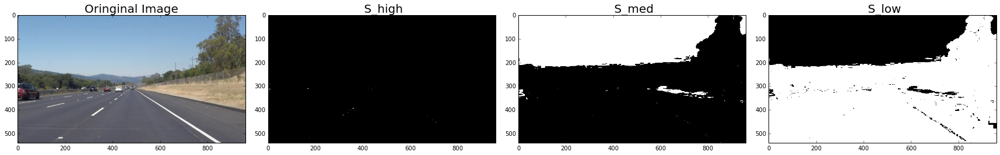

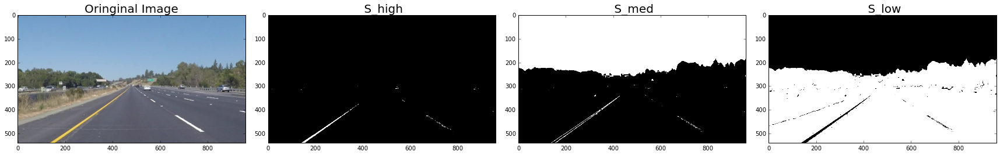

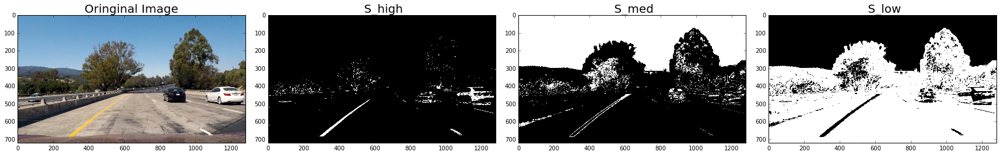

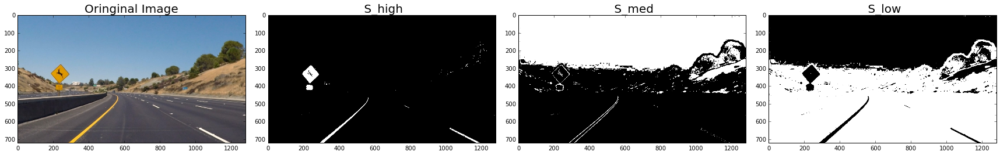

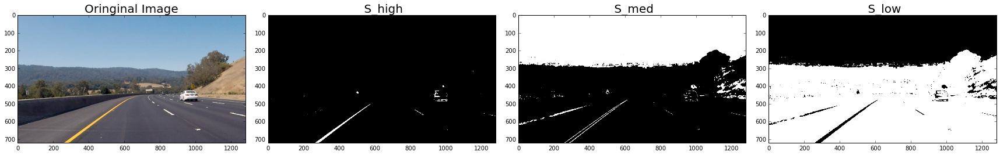

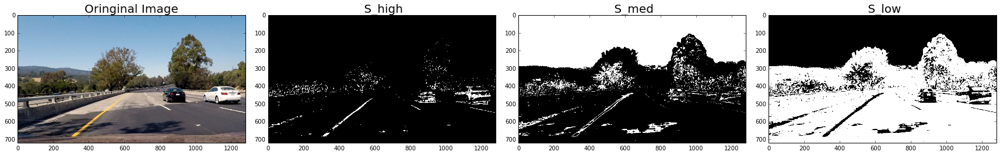

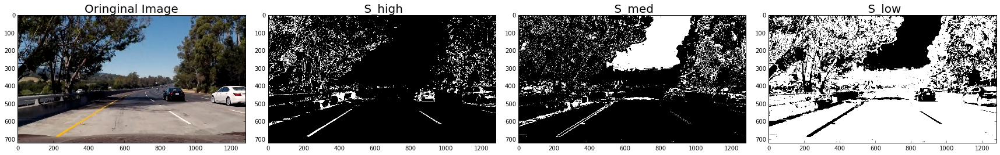

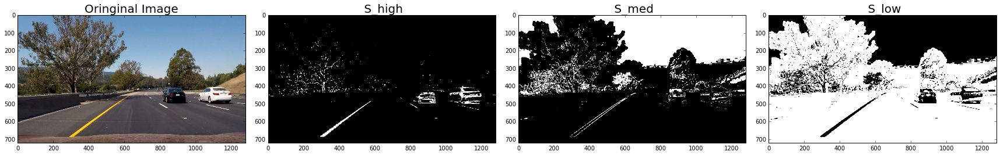

In [8]:
for idx, fname in enumerate(images):                 
    image = mpimg.imread(fname)
    HLS_h_low = HLS_select(image, thresh=(0,90), H_or_L_or_S= 'H', Binary = True)
    HLS_h_med = HLS_select(image, thresh=(90, 180), H_or_L_or_S= 'H', Binary = True)
    HLS_h_high = HLS_select(image, thresh=(174, 255), H_or_L_or_S= 'H', Binary = True)
    HLS_l_low = HLS_select(image, thresh=(0, 90),  H_or_L_or_S='L', Binary = True)
    HLS_l_med = HLS_select(image, thresh=(90, 180),  H_or_L_or_S='L', Binary = True)
    HLS_l_high = HLS_select(image, thresh=(174,255),  H_or_L_or_S='L', Binary = True)
    HLS_s_low = HLS_select(image, thresh=(0, 90),  H_or_L_or_S='S', Binary = True)
    HLS_s_med = HLS_select(image, thresh=(90, 180),  H_or_L_or_S='S', Binary = True)
    HLS_s_high = HLS_select(image, thresh=(174, 255),  H_or_L_or_S='S', Binary = True)
    
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1,4 , figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Oringinal Image', fontsize=20)
 
    ax2.imshow(HLS_s_high, cmap= 'gray')
    ax2.set_title(' S_high', fontsize=20)      
    ax3.imshow(HLS_s_med, cmap= 'gray')
    ax3.set_title(' S_med', fontsize=20)      
    ax4.imshow(HLS_s_low, cmap= 'gray')
    ax4.set_title(' S_low', fontsize=20) 

In [9]:
#Define a function that thresholds RGB
def RGB_select(img, thresh=(0,255), R_or_G_or_B = 'R', Binary = False):
    #hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    r = img[:,:,0]
    g = img[:,:,1]   
    b = img[:,:,2] 
    
    binary_output = np.zeros_like(r)   
    if R_or_G_or_B == 'R':
        if Binary:
            binary_output[(r > thresh[0]) & (r <= thresh[1])] = 1 
            return binary_output
        else:
            return  r
    elif(R_or_G_or_B=='G'):
        if Binary:        
            binary_output[(g > thresh[0]) & (g <= thresh[1])] = 1 
            return binary_output
        else:
            return  g  
    else:
        if Binary:
            binary_output[(b > thresh[0]) & (b <= thresh[1])] = 1  
            return binary_output
        else:
            return  b     


### Combining Thresholds

Many combinations were tried to best visualize the lane lines. A final combination included S channel with a high threshold, gradient in the x direction with a low threshold, magnitude and directional gradients. Masking was used.


In [11]:
#pipeline in process_image
def pipeline(image_p):
    #image = np.copy(image_p)

    hls = cv2.cvtColor(image_p, cv2.COLOR_RGB2HLS)
    s = hls[:,:,2]
    #b = image_p[:,:,2]    
    #Grayscale
    gray= cv2.cvtColor(image_p, cv2.COLOR_RGB2GRAY)   
    #Sobel x
    #r_binary_high=  RGB_select(image_p, thresh=(170,255), R_or_G_or_B = 'R', Binary = True)
    s_binary =    HLS_select(image_p, thresh=(174, 255),  H_or_L_or_S='S', Binary = True)
    ksize = 9 # Choose a larger odd number to smooth gradient measurements
    # Apply each of the thresholding functions
    gradx = abs_sobel_thresh(image_p, sobel_kernel=ksize, orient='x', thresh=(10, 150))#20,100#Range 0 to 255 
    #black with and without dstack single image ok without stack black with
    ####grady = abs_sobel_thresh(image_p, sobel_kernel=ksize, orient='y', thresh=(50, 200))#Range 0 to 255 
    #black with stack single, nonstack and stack#single image ok without stack black 
    mag_binary = mag_thresh(image_p, sobel_kernel=ksize, mag_thresh=(20,70))#(30,130))#(100,250))#70,250#30,100#Range 0 to 254 
    #black stacked not stacked image
    dir_binary = dir_threshold(image_p, sobel_kernel=ksize, thresh=(0.8, 1.05))#Range 0 to 1.6(pi/2)about
    
    #print(retval)
    #print(sxbinary.shape,sxbinary )
    #print(s_binary.shape,s_binary)
    #print(gradx.shape,gradx)
    #print(grady.shape,grady)
    #print(mag_binary.shape,mag_binary[50][200:500],type(mag_binary))
    #print(dir_binary.shape,dir_binary[50][200:500],type(dir_binary))

    combined = np.zeros_like(dir_binary)
    #combined_binary = np.zeros_like(sxbinary)
    #combined_binary[(s_binary == 255) | (sxbinary == 255)] = 1
    #combined[((gradx == 1) & (grady == 1)) | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[(gradx == 1)  | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[(gradx == 1)  | ((mag_binary == 1) & (dir_binary == 1))] = 1
    #combined[(gradx == 1)  & ((mag_binary == 1) & (dir_binary == 1))] = 1
    combined[(gradx == 1)  & ((mag_binary == 1) & (dir_binary == 1)) | (s_binary==1)] = 1
    #combined[(gradx == 1)  & ((mag_binary == 1) & (dir_binary == 1)) | (s_binary==1)& (r_binary_high==1)] = 1
    #add s 
    #remove y
    #add b low
    #dstack =np.dstack((s_binary,s_binary,s_binary))#!!!!!!CHANGE!!!!!!CHANGE!!!!!!
    #dstack =np.dstack((mag_binary,mag_binary,mag_binary))#!!!!!!CHANGE!!!!!!CHANGE!!!!!!
    #dstack =np.dstack((combined,combined,combined))#!!!!!!CHANGE!!!!!!CHANGE!!!!!!
    
    #return mag_binary
    #return gradx
    #return   s_binary
    #return   dstack
    return   combined

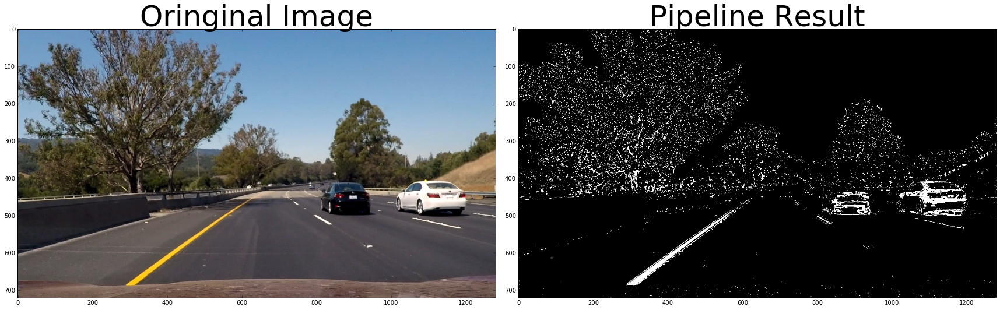

In [12]:
result = pipeline(image)
result_stack =np.dstack((result, result, result))

#Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Oringinal Image', fontsize=50)
ax2.imshow(result_stack, cmap= 'gray')
ax2.set_title('Pipeline Result', fontsize=50)

In [13]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

In [14]:
undist = cv2.undistort(image, mtx, dist, None, mtx)  

# 3-color and gradient threshold
binary = pipeline(undist)
img_shape=binary.shape


In [15]:
x_min = 0
y_min = 0
x_max = img_shape[1]
y_max = img_shape[0]

top_right = [x_max*0.585, y_max*0.64]
bottom_right = [x_max-0, y_max]
bottom_left = [x_min+55, y_max]
top_left = [x_max*0.425, y_max*0.64]

offset = 100 # offset for dst points
# Grab the image shape
#img_size = (undist.shape[1], undist.shape[0])

# For source points I'm grabbing the outer four detected corners
src = np.float32([top_left, top_right, bottom_right, bottom_left])
# For destination points, I'm arbitrarily choosing some points to be
# a nice fit for displaying our warped result 
dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                 [img_size[0]-offset, img_size[1]-offset], 
                                 [offset, img_size[1]-offset]])

vertices = np.array([[top_left, top_right, bottom_right, bottom_left]], dtype=np.int32)

In [16]:
#    vertices = np.array([[top_left, top_right, bottom_right, bottom_left]], dtype=np.int32)
masked_edges = region_of_interest(binary, vertices)

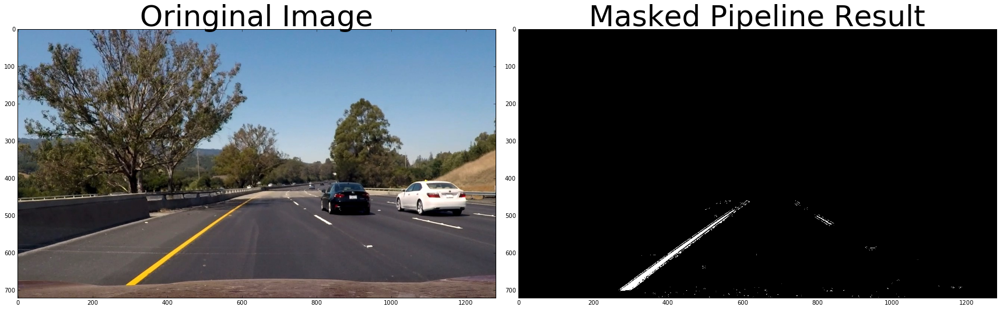

In [17]:
#Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Oringinal Image', fontsize=50)
ax2.imshow(masked_edges, cmap= 'gray')
ax2.set_title('Masked Pipeline Result', fontsize=50)

## Perspective Transform ("birds-eye view")
It will be easier to work with the binary lane line images if we had a bird eye view. The cv2.getPerspectiveTransform() was use to write a birds_eye() function to transform the lane line image.

In [20]:
# Define a function that takes an image, number of x and y points, 
# camera matrix and distortion coefficients
#def corners_unwarp(img, mtx, dist):
#def corners_unwarp(img): 

def birds_eye(undist, src, dst):    
    #img_shape =image.shape
    img_shape =undist.shape    
    
    # Given src and dst points, calculate the perspective transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Warp the image using OpenCV warpPerspective()
    warped = cv2.warpPerspective(undist, M,(img_shape[1],img_shape[0]), flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return warped, M

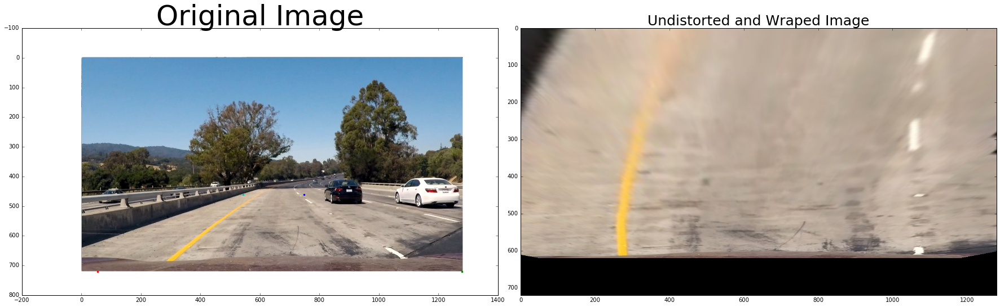

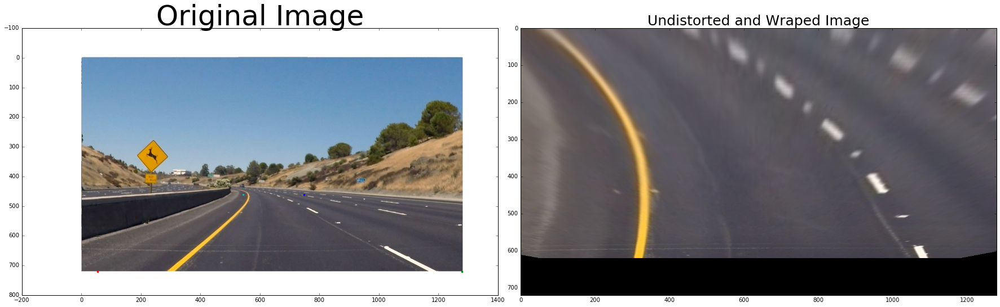

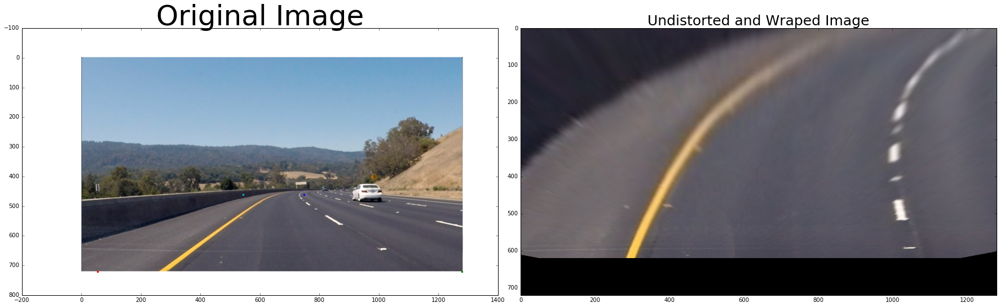

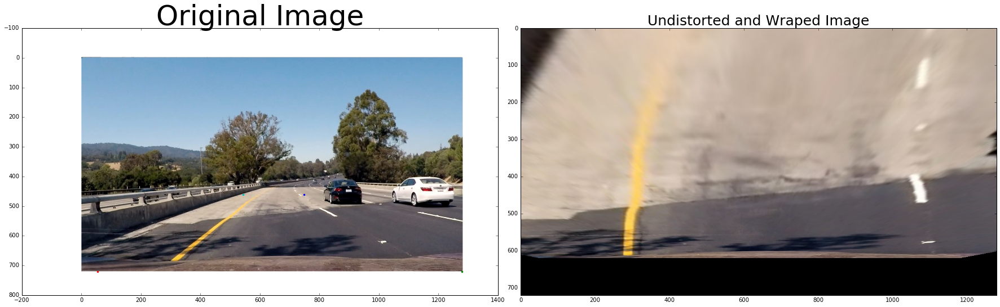

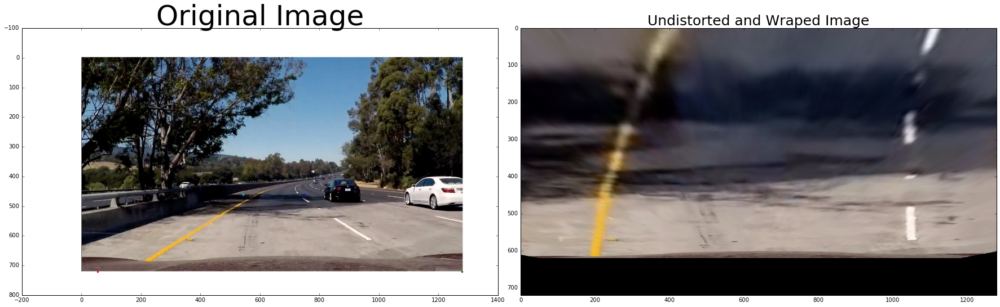

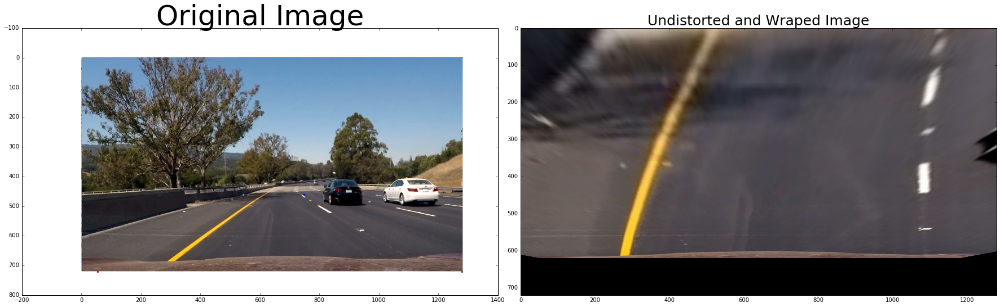

In [21]:
images = glob.glob('test_images/*')

# Step through the list 
for idx, fname in enumerate(images[2:]):                 
    image = mpimg.imread(fname)
    img_shape =image.shape
    x_min = 0
    y_min = 0
    x_max = img_shape[1]
    y_max = img_shape[0]
    top_right = [x_max*0.585, y_max*0.64]
    bottom_right = [x_max-0, y_max]
    bottom_left = [x_min+55, y_max]
    top_left = [x_max*0.425, y_max*0.64]    
    img_size = (image.shape[1], image.shape[0]) 
    vertices = np.array([[top_left, top_right, bottom_right, bottom_left]], dtype=np.int32)
#    top_down, perspective_M = corners_unwarp(image,mtx, dist)  
    undist = cv2.undistort(image, mtx, dist, None, mtx)
    top_down, perspective_M = birds_eye(undist, src, dst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize = (24, 9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.plot(top_right[0], top_right[1], '.')#top right blue
    ax1.plot(bottom_right[0], bottom_right[1], '.')#bottom right green
    ax1.plot(bottom_left[0], bottom_left[1], '.')#bottom left red
    ax1.plot(top_left[0], top_left[1], '.')#top left light green
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(top_down)
    ax2.set_title('Undistorted and Wraped Image', fontsize=25)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

In [22]:
#birds eye to transformed back to street
def birds_to_street(undist, src,dst):    
    #img_shape =image.shape
    img_shape =undist.shape 
    #print(img_shape)
    
    # Given src and dst points, calculate the perspective transform matrix
    Minv = cv2.getPerspectiveTransform( dst, src)
    # Warp the image using OpenCV warpPerspective()
    unwarped = cv2.warpPerspective(undist, Minv,(img_shape[1],img_shape[0]) , flags=cv2.INTER_LINEAR)

    # Return the resulting image and matrix
    return unwarped, Minv

## Detect Lane Pixels 
A Line class and a sliding window were used to find the lane line pixels. A histogram of the sum of the number of the pixels, in the lower half of the image, in each x positions was used to find the highest number of pixels and therefor the probable location of the starting point of the lane lines. Two histograms were used, one for the right half of the image and one for the left half. To save processing time two smaller windows were placed over the determined start points of each lane line. x and y postilions were recoded for each pixels in each row of the small windows. The average of the x postilions were used the calculate the next starting point of the next window. This resulted in the recording of x and y positions in a left or right Line class object. 

In [23]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?                    CHECK?
        self.detected = False                                       
        #The initial peak of the histogram on the full x range.           CHECK
        self.initial_peak= None                                            
        # x values of the last n fits of the line                        CHECK
        self.recent_xfitted = []
        #average x values of the fitted line over the last n iterations   CHECK
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations     CHECK
        self.best_fit = None  
        #polynomial coefficients for the most recent fit                  CHECK 
        self.current_fit = [np.array([False])]  
 
        #radius of curvature of the line in some units                  CHECK
        self.radius_of_curvature = None                                    
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits        CHECK
        #self.diffs = np.array([0,0,0], dtype='float') 
        self.diffs =[]
        self.diffs_all =[]
        self.diffs_l_r=[]
        self.diffs_l_r_all=[]
        #x values for detected line pixels                              CHECK
        self.allx = []              
        #y values for detected line pixels                                CHECK
        self.ally = []
        
        # polynomial coefficients values of the last n fits of the line    New CHECK
        self.recent_fit=[]
        self.all_fit=[]
        
        self.recent_yvals_l = []
        self.recent_yvals_r = []
        #find the camera offset from center of car
        self.diff_sum = 0
        self.left_avg = 0
        self.right_avg = 0
        
        self.left_fit_NOT_3 = 0
        self.left_fitx_NOT_gt_100 = 0
        
        self.lane_center_pixels_recent_n = []
        self.diff_from_center= []
        self.counter_1 = 0
        self.counter_2 = 0
        self.counter_3 = 0
        self.counter_4 = 0
        self.counter_4a = 0
        self.counter_5 = 0
        self.counter_6 = 0
        self.counter_7 = 0
        self.counter_8 = 0
        self.counter_9 = 0
        self.counter_9a = 0
        self.counter_10 = 0        
        self.ratio_A = []
        self.ratio_B = []       
        self.ratio_C = []

In [24]:
#Do this first before video
l_line=Line()
r_line=Line()

In [25]:
#sliding_window to find lane line pixel locations
def sliding_window(img,n):  
    l_line.allx=[]
    l_line.ally=[]
    r_line.allx=[]
    r_line.ally=[]
    #print ('start')
    #print (l_line.allx)
    #print (l_line.ally)
    #print (r_line.allx)
    #print (r_line.ally)  

    img_shape=img.shape
    #print(img_shape)

    histogram = np.sum(img[img.shape[0]/2:,:], axis= 0)

    #no lanes will start befor 100 or after 1175
    #any pixels in these ranges would be noise and set to zero.
    histogram[0:100]=0
    histogram[1175:]=0
    l_lane_x = False
    r_lane_x = False
    left_half = histogram[0:len(histogram)/2]
    right_half = histogram[len(histogram)/2:]
    l_line.initial_peak = np.argmax(left_half) 
    r_line.initial_peak = np.argmax(right_half)+len(histogram)/2
    l_lane_x = l_line.initial_peak
    r_lane_x = r_line.initial_peak    
    l_x_values=[]  
    r_x_values=[]
    #sliding window-starting at the bottom and sliding up 10% each slide
    for i in range(0, 10):
        #histogram = np.sum(img[img.shape[0]/2:,:], axis= 0)
        window_bottom= img_shape[0]-(img_shape[0]*0.1* i)
        window_top= img_shape[0]-(img_shape[0]*0.1*(i+1))          
        window_l = img[window_top:window_bottom,(l_lane_x-100):(l_lane_x+100)]   
        window_r = img[window_top:window_bottom,(r_lane_x-100):(r_lane_x+100)]  
        win_l_shape = window_l.shape
        win_r_shape = window_r.shape
        for j in range(0,  win_l_shape[0]):
            #gets the index values of the pixels position for that one row of window_l
            indexes_l = np.nonzero(window_l[j:j+1,:])[1]
            indexes_l_offset = (indexes_l-100)+l_lane_x
            l_x_values = np.append(l_x_values,indexes_l_offset)

            #y value will be same for all xs in row.
            #pixel_y_values=j+i*72
            pixel_y_values=720-(i*72)+(j) #test       
            num_x_values_in_row_l =len(indexes_l)
            #need to add as many y values to .ally as the number of x values added to .allx
            #how many x values
            array_y_values_l = [pixel_y_values] * num_x_values_in_row_l 
            l_line.ally = np.append(l_line.ally, array_y_values_l)

            #gets the index values of the pixels position for that one row of window_r        
            indexes_r = np.nonzero(window_r[j:j+1,:])[1]
            indexes_r_offset = (indexes_r-100)+r_lane_x
            r_x_values = np.append(r_x_values,indexes_r_offset) 

            #y value will be same for all xs in row.     
            num_x_values_in_row_r =len(indexes_r)
            #need to add as many y values to .ally as the number of x values added to .allx
            #how many x values
            array_y_values_r = [pixel_y_values] * num_x_values_in_row_r
            r_line.ally = np.append(r_line.ally, array_y_values_r)        

        previous_l_center = l_lane_x
        previous_r_center = r_lane_x
        if len(l_x_values)==0:
            l_lane_x = previous_l_center
        else:    
            # take the mean of all x values for this window
            #these means will be used as the center of the next window up
            #l_lane_x = (np.mean(l_x_values)-100) + previous_l_center
            l_lane_x = (np.mean(l_x_values))       
        if len(r_x_values) ==0:
            r_lane_x = previous_r_center
        else:
            #r_lane_x = (np.mean(r_x_values)-100) + previous_r_center 
            r_lane_x = (np.mean(r_x_values))  

        #take the x values from this window and appendt to self.allx
        l_line.allx = np.append(l_line.allx, l_x_values)
        r_line.allx = np.append(r_line.allx, r_x_values)
        #start from an empty array to get all the x values of the next window.
        num_of_xs_per_window_l =len(l_x_values)   
        num_of_xs_per_window_r =len(r_x_values)
        l_x_values=[]  
        r_x_values=[] 
        
        #store all l_line x values for last n fits in 'self.recent_xfitted'
        #print(l_line.recent_xfitted, 'starting point l_line.recent_xfitted')
        #print(r_line.recent_xfitted, 'starting point r_line.recent_xfitted')
    return l_line, r_line

### Determine Curvature of the Lane and Vehicle Position with Respect to Center
### Warp the Detected Lane Boundaries Back Onto the Original Image

A second order polynomial was fit to each line: f(y) = Ay^2 + By + C 
As discused in lesson 13 the resulting coeficients have the following meaning:
* A gives you the curvature of the lane line 
* B gives you the heading or direction that the line is pointing
* C gives you the position of the line based on how far away it is from the very left of an image (y = 0)

I used a few methods to find the lane line boundaries. First if  the current value of A, B or C were very different form the average of the past n values then the new image values must be wrong and the current values were not used. For this I created a ratio of current values divided by the average of the previous n images.  Second if the left and right A, B or C values were very different the line was probably not a lane line and not used. Lastly I used distance the lane line is from the center of the lane and if the current difference were very different form the previous n values the current values were not used.

The ranges of each factor were determined by collecting all results and getting the max, min and average. This gave me an idea were to set the cutoffs to remove data. With trial and error about 10 percent of values were excluded. Only results with noticeable positive changes were used. 

In the event a current image values were not used the average of the previous n values were used.

In [27]:
def pixels_to_image(warped, undist, src, dst, n):
    count_l_left_fitx = 0
    count_r_right_fitx = 0
    img_size = (warped.shape[1], warped.shape[0])   
    yvals_l=l_line.ally
    yvals_l=yvals_l[::-1]
    yvals_r=r_line.ally
    yvals_r=yvals_r[::-1]
    leftx= l_line.allx
    leftx = leftx[::-1]#Reverse to match top-to-bottom in y
    rightx= r_line.allx
    rightx = rightx[::-1]#Reverse to match top-to-bottom in y
    previous_fit_l = l_line.current_fit[0]
    previous_fit_r = r_line.current_fit[0]

    ####Get coeficients and fit x values
    ####
    #Fit a second order polynomial to each real lane line
    left_fit = np.polyfit(yvals_l, leftx, 2)       # !!!!!!left_fit = l_line.current_fitsave as back up 
    left_fitx = left_fit[0]*yvals_l**2 + left_fit[1]*yvals_l + left_fit[2]
    
    #Fit a second order polynomial to each real lane line
    right_fit = np.polyfit(yvals_r, rightx, 2)
    right_fitx = right_fit[0]*yvals_r**2 + right_fit[1]*yvals_r + right_fit[2]
    
    
    ####Find center of car relitive to center of lane  ###  
    ####
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension
    #determine center of the lane. 
    left_line_baseX = left_fit[2]#As stated in lesson 12 this is the distance from the bottom(y=720) left(x=0) of the image to the left lane line in pixels.
    left_line_baseMeters = left_line_baseX * xm_per_pix
    right_line_baseX = right_fit[2]#same for the right lane line.  
    right_line_baseMeters = right_line_baseX * xm_per_pix
    lane_center_pixels = left_line_baseX+(0.5 *(right_line_baseX-left_line_baseX))#in pixels
    #convert to meters
    lane_center_meters = lane_center_pixels * xm_per_pix # pixels * meter/pixel = meter
    car_center_pixels = (1280/2) +  43# 683 pixels from the bottom left of the image to the center of the car in pixels
    #Convert to meters.
    #meters from left of image
    car_center_meters = car_center_pixels * xm_per_pix 
    #Car center with respect to lane center in meters
    car_relative_position = lane_center_meters - car_center_meters
    #print(car_relative_position, 'car_relative_position meters')
    
    ####Set recent_xfitted and bestx 
    ####
    #recent_xfitted is x values of the last n fits of the line[[],[],....n]
    if (len(l_line.recent_xfitted) <n):
        l_line.recent_xfitted.append(left_fitx)
        l_line.recent_yvals_l.append(yvals_l)#New Don't need ??
    else:
        l_line.recent_xfitted = l_line.recent_xfitted[1:]
        l_line.recent_yvals_l = l_line.recent_yvals_l[1:]#New    Don't need ??     
        l_line.recent_xfitted.append(left_fitx)
        l_line.recent_yvals_l.append(yvals_l)#New
    #store all r_line x values for last n fits in 'self.recent_xfitted'
    if (len(r_line.recent_xfitted) <n):
        r_line.recent_xfitted.append(right_fitx)
        r_line.recent_yvals_r.append(yvals_r)#New
    else:
        r_line.recent_xfitted = r_line.recent_xfitted[1:]
        r_line.recent_yvals_r = r_line.recent_yvals_r[1:]#New
        r_line.recent_xfitted.append(right_fitx)
        r_line.recent_yvals_r.append(yvals_r)
    n_xfitted_l_concat =np.concatenate(l_line.recent_xfitted)
    n_yvals_l_concat =np.concatenate(l_line.recent_yvals_l)
    n_xfitted_r_concat =np.concatenate(r_line.recent_xfitted)        
    n_yvals_r_concat =np.concatenate(r_line.recent_yvals_r)  
    #bestx is average x values of the fitted line over the last n iterations
    l_line.bestx =np.average(np.concatenate(l_line.recent_xfitted))
    r_line.bestx =np.average(np.concatenate(r_line.recent_xfitted))

    ####Set self.current_fit, self.recent_fit and self.best_fit   
    ####
    #previous_fit_l = l_line.current_fit #Above
    #previous_fit_r = r_line.current_fit #Above
    #self.current_fit is polynomial coefficients for the most recent fit
    l_line.current_fit=left_fit
    r_line.current_fit=right_fit
    #print(l_line.current_fit,'l_line.current_fit')
    #print(r_line.current_fit,'r_line.current_fit')
    #print(,'')
    #print(,'')
    l_line.diffs = np.absolute(l_line.current_fit - previous_fit_l)
    r_line.diffs = np.absolute(r_line.current_fit - previous_fit_r)
    l_line.diffs_l_r = np.absolute(l_line.current_fit-r_line.current_fit)   
    #self.current_fit = [0,0,0]     
    l_line.diffs_all.append(l_line.diffs)
    r_line.diffs_all.append(r_line.diffs)
    l_line.diffs_l_r_all.append(l_line.diffs_l_r)

    if (l_line.lane_center_pixels_recent_n != []):
        #print(len(l_line.diff_from_center),'len(l_line.diff_from_center)')
        l_diff_from_center_n_max =np.max(l_line.diff_from_center)
        l_diff_from_center_n_average =np.average(l_line.diff_from_center)
        l_diff_from_center_n_min=np.min(l_line.diff_from_center)    

        #print(l_diff_from_center_n_max,'l_diff_from_center_n_max')
        #print(l_diff_from_center_n_average,'l_diff_from_center_n_average')
        #print(l_diff_from_center_n_min, 'l_diff_from_center_n_min') 
    if (r_line.lane_center_pixels_recent_n != []):
        #print(len(r_line.diff_from_center),'len(r_line.diff_from_center)')
        r_diff_from_center_n_max =np.max(r_line.diff_from_center)
        r_diff_from_center_n_average =np.average(r_line.diff_from_center)
        r_diff_from_center_n_min=np.min(r_line.diff_from_center)    
        #print(r_diff_from_center_n_max,'r_diff_from_center_n_max')
        #print(r_diff_from_center_n_average,'r_diff_from_center_n_average')
        #print(r_diff_from_center_n_min, 'r_diff_from_center_n_min')        
    if (len(l_line.recent_fit) >0):
        l_line.counter_1+=1
        n_fit_max =np.max( np.asarray(l_line.recent_fit), axis = 0) 
        n_fit_average =np.average(np.asarray(l_line.recent_fit), axis = 0) 
        n_fit_min=np.min(np.asarray(l_line.recent_fit), axis = 0)     
        #print('A = curvature, B = heading or direction, C = position of the line based')
        #print(n_fit_max, 'n_fit_max') 
        #print(n_fit_average, 'n_fit_average')
        #print(n_fit_min, 'n_fit_min')
        gt_n0=30
        gt_n1=10
        gt_n2=50
        lt_n0=30
        lt_n1=10
        lt_n2=50
        
        gt_d0=0.00000001
        gt_d1=0.001
        gt_d2=595
        lt_d0=0.0006
        lt_d1=6
        lt_d2=645  
        
        gt_d3= 240
        lt_d3 = 490
        
        l_line.ratio_A.append(l_line.current_fit[0]/n_fit_average[0])
        l_line.ratio_B.append(l_line.current_fit[1]/n_fit_average[1])
        l_line.ratio_C.append(l_line.current_fit[2]/n_fit_average[2])

        #print( l_line.ratio_A[-1] ,'l_line.ratio_A[-1] ')
        l_lane_center_pixels_recent_n_average  = np.average(l_line.lane_center_pixels_recent_n)
        l_diff = np.absolute(l_lane_center_pixels_recent_n_average - l_line.current_fit[2])
        #if (True):   
        #if ((l_diff < ( lt_d3)) and (l_diff > (gt_d3))):             
        if ((l_line.diffs_l_r[0] < ( lt_d0)) and (l_line.diffs_l_r[0] > (gt_d0))) \
            and ((l_line.diffs_l_r[1] < ( lt_d1)) and (l_line.diffs_l_r[1] > (gt_d1))) \
            and ((l_line.ratio_A[-1] < ( lt_n0)) and (l_line.ratio_A[-1] > (-1.0*gt_n0))):
            l_line.counter_2 +=1
            if (len(l_line.recent_fit) <n):
                l_line.recent_fit.append(l_line.current_fit)
                l_line.lane_center_pixels_recent_n.append(lane_center_pixels)
                l_lane_center_pixels_recent_n_max =np.max(l_line.lane_center_pixels_recent_n)
                l_lane_center_pixels_recent_n_average =np.average(l_line.lane_center_pixels_recent_n)
                l_lane_center_pixels_recent_n_min=np.min(l_line.lane_center_pixels_recent_n)    
                #print(l_lane_center_pixels_recent_n_max,'l_lane_center_pixels_recent_n_max')
                #print(l_lane_center_pixels_recent_n_average,'l_lane_center_pixels_recent_n_average')
                #print(l_lane_center_pixels_recent_n_min, 'l_lane_center_pixels_recent_n_min')                
                l_line_diff_from_n_recent_center = np.absolute(l_lane_center_pixels_recent_n_average - l_line.current_fit[2])
                #print(l_line_diff_from_n_recent_center,'l_line_diff_from_n_recent_center')
                l_line.diff_from_center.append(l_line_diff_from_n_recent_center)
                l_line.counter_3+=1
            else:
                l_line.recent_fit = l_line.recent_fit[1:]
                l_line.recent_fit.append(l_line.current_fit)
                l_line.lane_center_pixels_recent_n = l_line.lane_center_pixels_recent_n[1:]
                l_line.lane_center_pixels_recent_n.append(lane_center_pixels)
                l_lane_center_pixels_recent_n_max =np.max(l_line.lane_center_pixels_recent_n)
                l_lane_center_pixels_recent_n_average =np.average(l_line.lane_center_pixels_recent_n)
                l_lane_center_pixels_recent_n_min=np.min(l_line.lane_center_pixels_recent_n)    
                #print(l_lane_center_pixels_recent_n_max,'l_lane_center_pixels_recent_n_max')
                #print(l_lane_center_pixels_recent_n_average,'l_lane_center_pixels_recent_n_average')
                #print(l_lane_center_pixels_recent_n_min, 'l_lane_center_pixels_recent_n_min')                
                l_line_diff_from_n_recent_center = np.absolute(l_lane_center_pixels_recent_n_average - l_line.current_fit[2])
                #print(l_line_diff_from_n_recent_center,'l_line_diff_from_n_recent_center')
                l_line.diff_from_center.append(l_line_diff_from_n_recent_center)                
                l_line.counter_4+=1
        else:
            l_line.counter_4a +=1
    else:
        l_line.recent_fit.append(l_line.current_fit)
        l_line.lane_center_pixels_recent_n.append(lane_center_pixels)
        l_lane_center_pixels_recent_n_max =np.max(l_line.lane_center_pixels_recent_n)
        l_lane_center_pixels_recent_n_average =np.average(l_line.lane_center_pixels_recent_n)
        l_lane_center_pixels_recent_n_min=np.min(l_line.lane_center_pixels_recent_n)    
        #print(l_lane_center_pixels_recent_n_max,'l_lane_center_pixels_recent_n_max')
        #print(l_lane_center_pixels_recent_n_average,'l_lane_center_pixels_recent_n_average')
        #print(l_lane_center_pixels_recent_n_min, 'l_lane_center_pixels_recent_n_min')        
        l_line_diff_from_n_recent_center = np.absolute(l_lane_center_pixels_recent_n_average - l_line.current_fit[2])
        #print(l_line_diff_from_n_recent_center,'l_line_diff_from_n_recent_center')
        l_line.diff_from_center.append(l_line_diff_from_n_recent_center)
        l_line.counter_5+=1
        
    if (len(r_line.recent_fit) >0):
        l_line.counter_6+=1
        n_fit_max =np.max(np.asarray(r_line.recent_fit), axis = 0) 
        n_fit_average =np.average(np.asarray(r_line.recent_fit), axis = 0) 
        n_fit_min=np.min(np.asarray(r_line.recent_fit), axis = 0)     
        #print('A = curvature, B = heading or direction, C = position of the line based')
        #print(n_fit_max, 'n_fit_max') 
        #print(n_fit_average, 'n_fit_average')
        #print(n_fit_min, 'n_fit_min')
        nt=0.1
        gt_n0=20
        gt_n1=9
        gt_n2=50
        lt_n0=20
        lt_n1=9
        lt_n2=50

        #self.recent_fit is polynomial coefficients values of the last n fits of the line
        #Save n most recent fits if good fits.
        #if the current A coefficients is with in a percentage of n recent A coefficents average
        #& if the current B coefficients is with in a percentage of n recent B coefficents average
        #& if the current C coefficients is with in a percentage of n recent C coefficents average
        r_line.ratio_A.append(r_line.current_fit[0]/n_fit_average[0])
        r_line.ratio_B.append(r_line.current_fit[1]/n_fit_average[1])
        r_line.ratio_C.append(r_line.current_fit[2]/n_fit_average[2])
        ratio_A_max =np.max(r_line.ratio_A) 
        ratio_A_average =np.average(r_line.ratio_A) 
        ratio_A_min=np.min(r_line.ratio_A)           
        ratio_B_max =np.max(r_line.ratio_B) 
        ratio_B_average =np.average(r_line.ratio_B) 
        ratio_B_min=np.min(r_line.ratio_B)    
        ratio_C_max =np.max(r_line.ratio_C) 
        ratio_C_average =np.average(r_line.ratio_C) 
        ratio_C_min=np.min(r_line.ratio_C) 
     
        r_lane_center_pixels_recent_n_average  = np.average(r_line.lane_center_pixels_recent_n)
        #print(r_lane_center_pixels_recent_n_average,'r_lane_center_pixels_recent_n_average')
        r_diff = np.absolute(r_lane_center_pixels_recent_n_average - r_line.current_fit[2])        
        #print (r_diff, 'r_diff ***')
        #if(True):  
        if ((l_line.diffs_l_r[0] < ( lt_d0)) and (l_line.diffs_l_r[0] > (gt_d0))) \
            and ((l_line.diffs_l_r[1] < ( lt_d1)) and (l_line.diffs_l_r[1] > (gt_d1))) \
            and ((r_line.ratio_B[-1] < ( lt_n1)) and (r_line.ratio_B[-1] > (-1.0*gt_n1))) \
            and (r_diff < ( lt_d3)) and (r_diff > (gt_d3)):
            l_line.counter_7+=1
            if (len(r_line.recent_fit) <n):
                r_line.recent_fit.append(r_line.current_fit)
                r_line.lane_center_pixels_recent_n.append(lane_center_pixels)
                r_lane_center_pixels_recent_n_max =np.max(r_line.lane_center_pixels_recent_n)
                r_lane_center_pixels_recent_n_average =np.average(r_line.lane_center_pixels_recent_n)
                r_lane_center_pixels_recent_n_min=np.min(r_line.lane_center_pixels_recent_n)    
                #print(r_lane_center_pixels_recent_n_max,'r_lane_center_pixels_recent_n_max')
                #print(r_lane_center_pixels_recent_n_average,'r_lane_center_pixels_recent_n_average')
                #print(r_lane_center_pixels_recent_n_min, 'r_lane_center_pixels_recent_n_min')  
                r_line_diff_from_n_recent_center = np.absolute(r_lane_center_pixels_recent_n_average - r_line.current_fit[2])
                #print(r_line_diff_from_n_recent_center,'r_line_diff_from_n_recent_center')
                r_line.diff_from_center.append(r_line_diff_from_n_recent_center)
                l_line.counter_8+=1
            else:
                r_line.recent_fit = r_line.recent_fit[1:]
                r_line.recent_fit.append(r_line.current_fit)
                r_line.lane_center_pixels_recent_n = r_line.lane_center_pixels_recent_n[1:]
                r_line.lane_center_pixels_recent_n.append(lane_center_pixels)               
                r_lane_center_pixels_recent_n_max =np.max(r_line.lane_center_pixels_recent_n)
                r_lane_center_pixels_recent_n_average =np.average(r_line.lane_center_pixels_recent_n)
                r_lane_center_pixels_recent_n_min=np.min(r_line.lane_center_pixels_recent_n)    
                #print(r_lane_center_pixels_recent_n_max,'r_lane_center_pixels_recent_n_max')
                #print(r_lane_center_pixels_recent_n_average,'r_lane_center_pixels_recent_n_average')
                #print(r_lane_center_pixels_recent_n_min, 'r_lane_center_pixels_recent_n_min')  
                r_line_diff_from_n_recent_center = np.absolute(r_lane_center_pixels_recent_n_average - r_line.current_fit[2])
                #print(r_line_diff_from_n_recent_center,'r_line_diff_from_n_recent_center')
                r_line.diff_from_center.append(r_line_diff_from_n_recent_center)                
                l_line.counter_9+=1
        else:    
            l_line.counter_9a +=1
    else:
        r_line.recent_fit.append(r_line.current_fit)
        r_line.lane_center_pixels_recent_n.append(lane_center_pixels)
        r_lane_center_pixels_recent_n_max =np.max(r_line.lane_center_pixels_recent_n)
        r_lane_center_pixels_recent_n_average =np.average(r_line.lane_center_pixels_recent_n)
        r_lane_center_pixels_recent_n_min=np.min(r_line.lane_center_pixels_recent_n)     
        r_line_diff_from_n_recent_center = np.absolute(r_lane_center_pixels_recent_n_average - r_line.current_fit[2])
        r_line.diff_from_center.append(r_line_diff_from_n_recent_center)        
        l_line.counter_10+=1  
    
    
    #get the max, min, average of the A,B and C coefficients in the n recent fits from left_fit and  right_fit
    #polynomial coefficients averaged over the last n iterations 
    #Get average to calulate best fit
    l_line.best_fit =np.average(np.asarray(l_line.recent_fit), axis = 0)
    r_line.best_fit =np.average(np.asarray(r_line.recent_fit), axis = 0) 
  

    # 2-Define y-value where we want radius of curvature
    #I'll choose the maximum y-value, corresponding to the bottom of the image
    y_eval_l = np.max(yvals_l)
    y_eval_r = np.max(yvals_r)
    left_curverad= ((1+(2*left_fit[0]*y_eval_l + left_fit[1])**2)**1.5)/np.absolute(2*left_fit[0])
    #right_curverad= ((1+(2*right_fit[0]*y_eval + right_fit[1])**2)**1.5/np.absolute(2*right_fit[0])
    right_curverad= ((1+(2*right_fit[0]*y_eval_r + right_fit[1])**2)**1.5)/np.absolute(2*right_fit[0])
    #print(left_curverad, right_curverad)

    # 3-Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meteres per pixel in x dimension

    left_fit_cr = np.polyfit(yvals_l*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(yvals_r*ym_per_pix, rightx*xm_per_pix, 2)
    left_curverad = ((1 + (2*left_fit_cr[0]*y_eval_l + left_fit_cr[1])**2)**1.5) \
                                 /np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*y_eval_r + right_fit_cr[1])**2)**1.5) \
                                    /np.absolute(2*right_fit_cr[0])
    # Now our radius of curvature is in meters
    #print(left_curverad, 'm', right_curverad, 'm') 
    # Example values: 3380.7 m    3189.3 m
    l_line.radius_of_curvature = left_curverad
    r_line.radius_of_curvature = right_curverad

    # 4-Create an image to draw the lines on
    warp_zero = np.zeros_like(warped).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))

    #Method C plus best fit
    yvals_l = np.linspace(25, 100, num=101)*7.2  # to cover same y-range as image
    left_fitx = l_line.best_fit[0]*yvals_l**2 + l_line.best_fit[1]*yvals_l + l_line.best_fit[2]
    yvals_r = np.linspace(25, 100, num=101)*7.2  # to cover same y-range as image
    right_fitx = r_line.best_fit[0]*yvals_r**2 + r_line.best_fit[1]*yvals_r + r_line.best_fit[2]       

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, yvals_l]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, yvals_r])))])
    pts = np.hstack((pts_left, pts_right))
    #print(pts)
    
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    newwarp, Minv = birds_to_street(color_warp, src,dst)

    # Combine the result with the original image
    result = cv2.addWeighted(undist, 1, newwarp, 0.3, 0)

    font = cv2.FONT_HERSHEY_SIMPLEX
    
    cv2.putText(result, str("Left Radius (meters)"), (10,600), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, str("Right Radius (meters)"), (900,600), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, str("Car Relative Position (meters)"), (520,70), font, 1, (255,255,255), 2, cv2.LINE_AA)    
    cv2.putText(result, str(l_line.radius_of_curvature), (10,650), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, str(r_line.radius_of_curvature), (1000,650), font, 1, (255,255,255), 2, cv2.LINE_AA)
    cv2.putText(result, str(car_relative_position), (620,130), font, 1, (255,255,255), 2, cv2.LINE_AA)

    return result

### Output Visual Display of the Lane Boundaries and Numerical Estimation of Lane Curvature and Vehicle Position

In [28]:
def process_image(image):
    #print (image.shape)

    #img_size = image.shape    
    img_shape = image.shape  

    img_size = (image.shape[1], image.shape[0]) 
    #print(img_size)
    x_min = 0
    y_min = 0
    x_max = img_shape[1]
    y_max = img_shape[0]

    top_right = [x_max*0.585, y_max*0.64]
    bottom_right = [x_max-0, y_max]
    bottom_left = [x_min+55, y_max]
    top_left = [x_max*0.425, y_max*0.64]
    offset = 100 # offset for dst points
    
    src = np.float32([top_left, top_right, bottom_right, bottom_left])
    dst = np.float32([[offset, offset], [img_size[0]-offset, offset], 
                                     [img_size[0]-offset, img_size[1]-offset], 
                                     [offset, img_size[1]-offset]])

    #masking
    vertices = np.array([[top_left, top_right, bottom_right, bottom_left]], dtype=np.int32)

    # 1-calibration runs one time 
    
    # 2-correct distortion
    # Use the OpenCV undistort() function to remove distortion
    undist = cv2.undistort(image, mtx, dist, None, mtx)  

    # 3-color and gradient threshold
    binary = pipeline(undist)

    # vertices = np.array([[top_left, top_right, bottom_right, bottom_left]], dtype=np.int32)
    masked_edges = region_of_interest(binary, vertices)


    # 4-transform
    warped, M = birds_eye(masked_edges, src, dst)  

    #All data in sliding windows is stored in l_line and r_line
    sliding_window(warped, n=2) 

    result = pixels_to_image(warped, undist,src,dst,n=2)

    #return binary
    return result
    #return warped, undist
    #return warped, image
    #return dstack

In [29]:
# 1-calibration 
ret, mtx, dist, rvecs, tvecs =    calibrate_lens('camera_cal/calibration*.jpg', nx =9, ny =6) 

# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

#Uncomment one of the following 3
project_video = VideoFileClip('project_video.mp4')
project_video_output = 'project_video_output.mp4'
clip = VideoFileClip("project_video.mp4")

#challenge_video = VideoFileClip('challenge_video.mp4')
#challenge_video_output = 'challenge_video_output.mp4'
#clip = VideoFileClip("challenge_video.mp4")

#harder_challenge_video = VideoFileClip('harder_challenge_video.mp4')
#harder_challenge_video_output = 'harder_challenge_video_output.mp4'
#clip = VideoFileClip('harder_challenge_video.mp4')

#Uncomment one of the following 3
project_video_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
%time project_video_clip.write_videofile(project_video_output, audio=False)

#project_video_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
#%time project_video_clip.write_videofile(challenge_video_output, audio=False)

#project_video_clip = clip.fl_image(process_image) #NOTE: this function expects color images!!
#%time project_video_clip.write_videofile(harder_challenge_video_output, audio=False)

#.format(project_video_output))
#.format(challenge_video_output))
#.format(harder_challenge_video_output))

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(project_video_output))

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [04:48<00:00,  4.48it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 5min 28s, sys: 57.8 s, total: 6min 26s
Wall time: 4min 49s


This was an awesome topic. This was my first real implementation of a class that was useful. The notebook is designed to be a grand pipeline. So I can go back when time permits and improve and visualize the improvements as I go. Later I plan to try the challenges. I want to print out all RGB, and directional and magnitude gradients the way I did here with S channel. This will help me pick a better combination to create a binary image of the lanes. Also, I was thinking the vertices for the masking now is 4 points. If I could make the points in the vertices similar to the point in the lane lines of the previous image but slightly wider apart this would create a dynamic masking that closely mimics the previous images lane lines but father apart. Lastly I want to impliment a video for each stage of the prosses. So a video binary images or a video of the transformed, masked binary images.  